# Segmenatacion de imagenes 

### Librerias

In [1]:
#import torch
#import torchvision
from PIL import Image, ImageOps
import numpy as np
import cv2
import matplotlib.pyplot as plt
from io import BytesIO
from rembg import remove
import os
from pathlib import Path
import concurrent.futures

# Experimentacion 



# procesos de segmentacion 

## Eliminación de Fondos en Imágenes Usando rembg

In [2]:
def remove_background_and_generate_masks(input_image_path, background_color=(0, 0, 0)):
    try:
        # Cargar la imagen
        with Image.open(input_image_path) as img:
            # Eliminar el fondo
            img_no_bg = remove(img)
            
            # Crear un fondo de color negro
            bg_color = Image.new("RGBA", img_no_bg.size, background_color)
            img_with_bg = Image.alpha_composite(bg_color, img_no_bg)
            
            # Crear una máscara binaria
            grayscale = img_no_bg.convert("L")  # Convertir a escala de grises
            mask = grayscale.point(lambda p: p > 0 and 255)  # Crear máscara binaria
            return img, img_with_bg, mask
    
    except Exception as e:
        print(f"Error al procesar la imagen: {str(e)}")
        return None, None, None

def display_images(original, processed, mask):
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))
    
    ax1.imshow(original)
    ax1.set_title('Imagen Original')
    ax1.axis('off')
    
    ax2.imshow(processed)
    ax2.set_title('Fondo Removido (Negro)')
    ax2.axis('off')
    
    ax3.imshow(mask, cmap='gray')
    ax3.set_title('Máscara')
    ax3.axis('off')
    
    plt.tight_layout()
    plt.show()


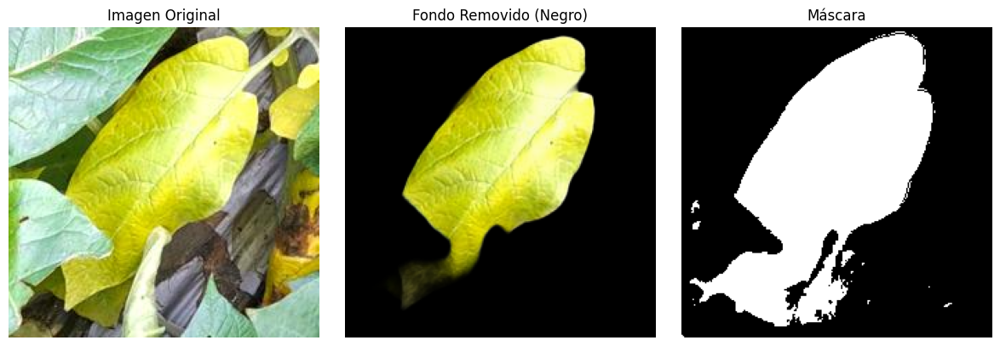

In [3]:
input_image_path = '../data/processed/preprocessed_potato_leaf/Daños por nematodos/imagen_0005.jpg'

# Procesar las imágenes
original, processed, mask = remove_background_and_generate_masks(input_image_path)

# Mostrar las imágenes
if original and processed and mask:
    display_images(original, processed, mask)
else:
    print("No se pudieron procesar las imágenes correctamente.")

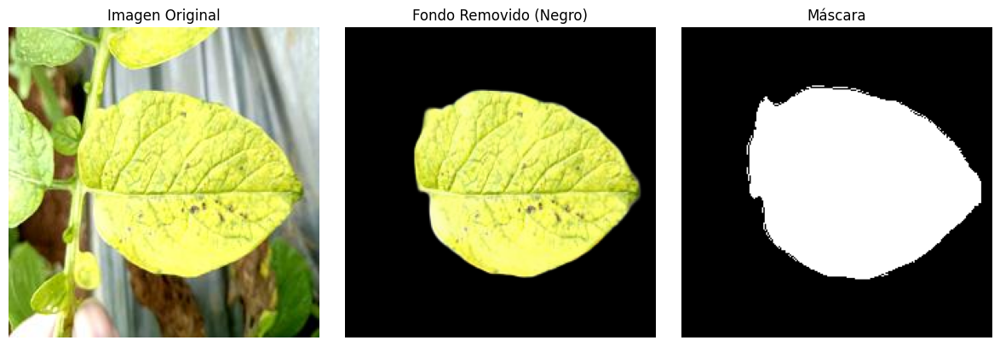

In [4]:
input_image_path = '../data/processed/preprocessed_potato_leaf/Daños por nematodos/imagen_0101.jpg'


# Procesar las imágenes
original, processed, mask = remove_background_and_generate_masks(input_image_path)

# Mostrar las imágenes
if original and processed and mask:
    display_images(original, processed, mask)
else:
    print("No se pudieron procesar las imágenes correctamente.")

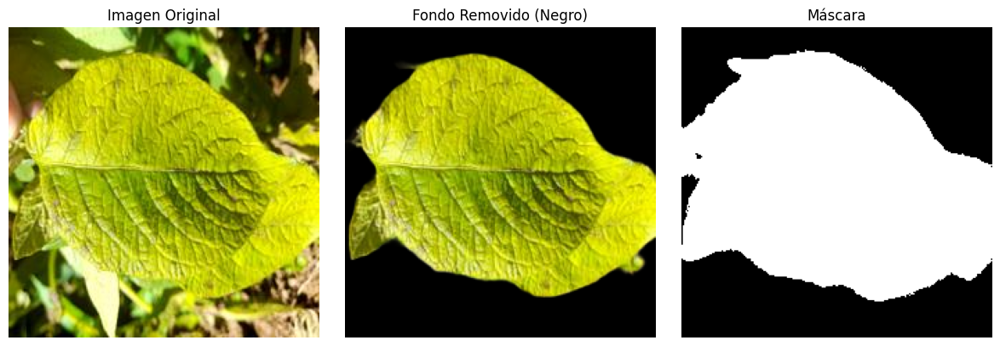

In [5]:
input_image_path = '../data/processed/preprocessed_potato_leaf/Daños por nematodos/imagen_0002.jpg'


# Procesar las imágenes
original, processed, mask = remove_background_and_generate_masks(input_image_path)

# Mostrar las imágenes
if original and processed and mask:
    display_images(original, processed, mask)
else:
    print("No se pudieron procesar las imágenes correctamente.")

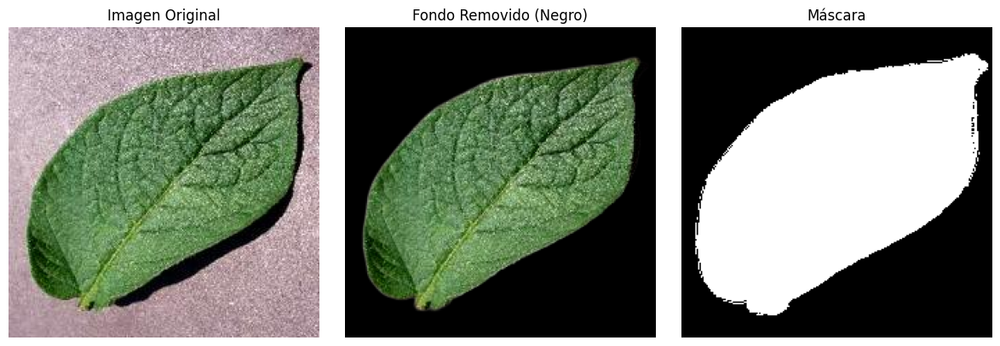

In [6]:
input_image_path = ruta_imagen = '../data/processed/preprocessed_potato_leaf/salud/imagen_0002.jpg'

# Procesar las imágenes
original, processed, mask = remove_background_and_generate_masks(input_image_path)

# Mostrar las imágenes
if original and processed and mask:
    display_images(original, processed, mask)
else:
    print("No se pudieron procesar las imágenes correctamente.")

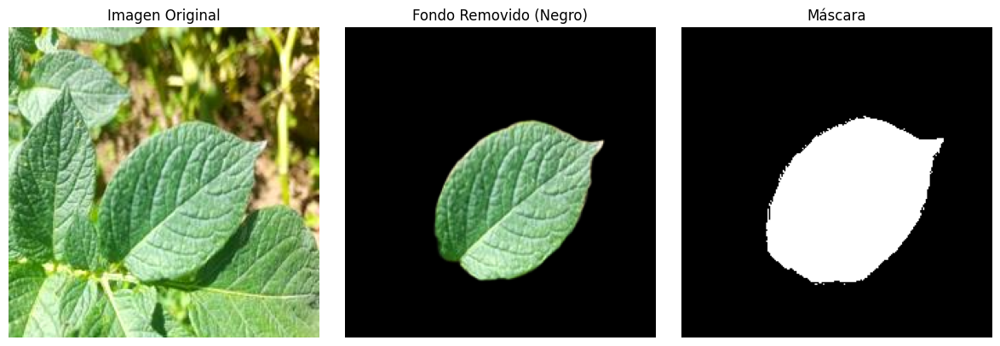

In [7]:
input_image_path = ruta_imagen = '../data/processed/preprocessed_potato_leaf/salud/imagen_0032.jpg'

# Procesar las imágenes
original, processed, mask = remove_background_and_generate_masks(input_image_path)

# Mostrar las imágenes
if original and processed and mask:
    display_images(original, processed, mask)
else:
    print("No se pudieron procesar las imágenes correctamente.")

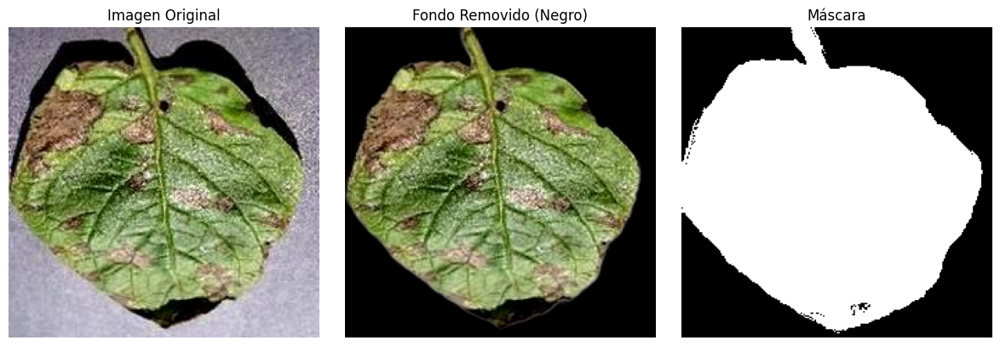

In [8]:
input_image_path = ruta_imagen = '../data/processed/preprocessed_potato_leaf/Tizón temprano/imagen_1005.jpg'

# Procesar las imágenes
original, processed, mask = remove_background_and_generate_masks(input_image_path)

# Mostrar las imágenes
if original and processed and mask:
    display_images(original, processed, mask)
else:
    print("No se pudieron procesar las imágenes correctamente.")

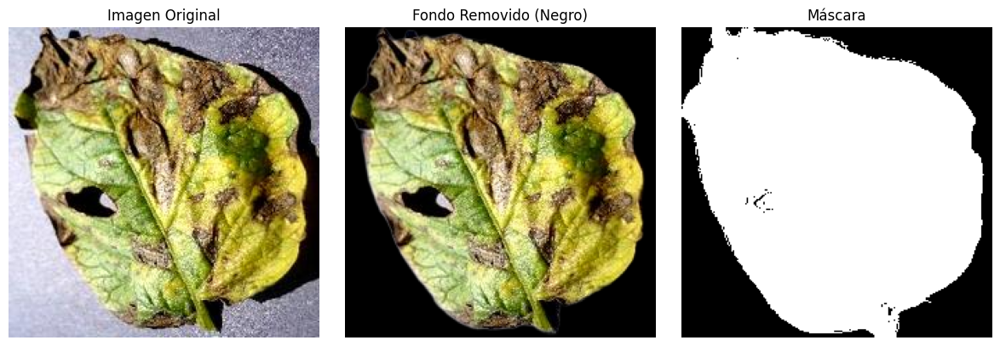

In [9]:
input_image_path = ruta_imagen = '../data/processed/preprocessed_potato_leaf/Tizón temprano/imagen_0110.jpg'

# Procesar las imágenes
original, processed, mask = remove_background_and_generate_masks(input_image_path)

# Mostrar las imágenes
if original and processed and mask:
    display_images(original, processed, mask)
else:
    print("No se pudieron procesar las imágenes correctamente.")

In [10]:

def process_multiple_images(input_folder, output_folder_no_bg, output_folder_mask):
    # Asegurarse de que las carpetas de salida existan
    os.makedirs(output_folder_no_bg, exist_ok=True)
    os.makedirs(output_folder_mask, exist_ok=True)

    # Obtener lista de archivos de imagen en la carpeta de entrada
    image_files = [f for f in os.listdir(input_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp'))]

    def process_single_image(image_file):
        input_path = os.path.join(input_folder, image_file)
        output_path_no_bg = os.path.join(output_folder_no_bg, f"no_bg_{image_file}")
        output_path_mask = os.path.join(output_folder_mask, f"mask_{os.path.splitext(image_file)[0]}.png")

        # Procesar la imagen
        original, processed, mask = remove_background_and_generate_masks(input_path)

        if original is not None and processed is not None and mask is not None:
            # Convertir la imagen procesada a RGB si está en modo RGBA
            if processed.mode == 'RGBA':
                processed = processed.convert('RGB')

            # Determinar el formato de salida
            output_format = 'PNG' if image_file.lower().endswith('.png') else 'JPEG'

            # Guardar la imagen sin fondo
            processed.save(output_path_no_bg, format=output_format)

            # Guardar la máscara
            mask.save(output_path_mask)

            return f"Procesada: {image_file}"
        else:
            return f"Error al procesar: {image_file}"

    # Usar multithreading para procesar las imágenes en paralelo
    with concurrent.futures.ThreadPoolExecutor() as executor:
        results = list(executor.map(process_single_image, image_files))

    # Imprimir resultados
    for result in results:
        print(result)


In [38]:
# Definir las rutas
input_folder = '../data/processed/preprocessed_potato_leaf/Daños por nematodos'
output_folder_no_bg = '../data/final_data_sin_fonfo/Daños por nematodos'
output_folder_mask = '../data/final_data_Maskara/Daños por nematodos'

In [39]:
process_multiple_images(input_folder, output_folder_no_bg, output_folder_mask)


Procesada: imagen_0001.jpg
Procesada: imagen_0002.jpg
Procesada: imagen_0003.jpg
Procesada: imagen_0004.jpg
Procesada: imagen_0005.jpg
Procesada: imagen_0006.jpg
Procesada: imagen_0007.jpg
Procesada: imagen_0008.jpg
Procesada: imagen_0009.jpg
Procesada: imagen_0010.jpg
Procesada: imagen_0011.jpg
Procesada: imagen_0012.jpg
Procesada: imagen_0013.jpg
Procesada: imagen_0014.jpg
Procesada: imagen_0015.jpg
Procesada: imagen_0016.jpg
Procesada: imagen_0017.jpg
Procesada: imagen_0018.jpg
Procesada: imagen_0019.jpg
Procesada: imagen_0020.jpg
Procesada: imagen_0021.jpg
Procesada: imagen_0022.jpg
Procesada: imagen_0023.jpg
Procesada: imagen_0024.jpg
Procesada: imagen_0025.jpg
Procesada: imagen_0026.jpg
Procesada: imagen_0027.jpg
Procesada: imagen_0028.jpg
Procesada: imagen_0029.jpg
Procesada: imagen_0030.jpg
Procesada: imagen_0031.jpg
Procesada: imagen_0032.jpg
Procesada: imagen_0033.jpg
Procesada: imagen_0034.jpg
Procesada: imagen_0035.jpg
Procesada: imagen_0036.jpg
Procesada: imagen_0037.jpg
P

In [40]:
# Definir las rutas
input_folder = '../data/processed/preprocessed_potato_leaf/salud'
output_folder_no_bg = '../data/final_data_sin_fonfo/salud'
output_folder_mask = '../data/final_data_Maskara/salud'

In [41]:
process_multiple_images(input_folder, output_folder_no_bg, output_folder_mask)

Procesada: imagen_0001.jpg
Procesada: imagen_0002.jpg
Procesada: imagen_0003.jpg
Procesada: imagen_0004.jpg
Procesada: imagen_0005.jpg
Procesada: imagen_0006.jpg
Procesada: imagen_0007.jpg
Procesada: imagen_0008.jpg
Procesada: imagen_0009.jpg
Procesada: imagen_0010.jpg
Procesada: imagen_0011.jpg
Procesada: imagen_0012.jpg
Procesada: imagen_0013.jpg
Procesada: imagen_0014.jpg
Procesada: imagen_0015.jpg
Procesada: imagen_0016.jpg
Procesada: imagen_0017.jpg
Procesada: imagen_0018.jpg
Procesada: imagen_0019.jpg
Procesada: imagen_0020.jpg
Procesada: imagen_0021.jpg
Procesada: imagen_0022.jpg
Procesada: imagen_0023.jpg
Procesada: imagen_0024.jpg
Procesada: imagen_0025.jpg
Procesada: imagen_0026.jpg
Procesada: imagen_0027.jpg
Procesada: imagen_0028.jpg
Procesada: imagen_0029.jpg
Procesada: imagen_0030.jpg
Procesada: imagen_0031.jpg
Procesada: imagen_0032.jpg
Procesada: imagen_0033.jpg
Procesada: imagen_0034.jpg
Procesada: imagen_0035.jpg
Procesada: imagen_0036.jpg
Procesada: imagen_0037.jpg
P

In [93]:
# Definir las rutas
input_folder = '../data/processed/preprocessed_potato_leaf/Tizón temprano'
output_folder_no_bg = '../data/final_data_sin_fonfo/Tizón temprano'
output_folder_mask = '../data/final_data_Maskara/Tizón temprano'

In [94]:

process_multiple_images(input_folder, output_folder_no_bg, output_folder_mask)

Procesada: imagen_0001.jpg
Procesada: imagen_0002.jpg
Procesada: imagen_0003.jpg
Procesada: imagen_0004.jpg
Procesada: imagen_0005.jpg
Procesada: imagen_0006.jpg
Procesada: imagen_0007.jpg
Procesada: imagen_0008.jpg
Procesada: imagen_0009.jpg
Procesada: imagen_0010.jpg
Procesada: imagen_0011.jpg
Procesada: imagen_0012.jpg
Procesada: imagen_0013.jpg
Procesada: imagen_0014.jpg
Procesada: imagen_0015.jpg
Procesada: imagen_0016.jpg
Procesada: imagen_0017.jpg
Procesada: imagen_0018.jpg
Procesada: imagen_0019.jpg
Procesada: imagen_0020.jpg
Procesada: imagen_0021.jpg
Procesada: imagen_0022.jpg
Procesada: imagen_0023.jpg
Procesada: imagen_0024.jpg
Procesada: imagen_0025.jpg
Procesada: imagen_0026.jpg
Procesada: imagen_0027.jpg
Procesada: imagen_0028.jpg
Procesada: imagen_0029.jpg
Procesada: imagen_0030.jpg
Procesada: imagen_0031.jpg
Procesada: imagen_0032.jpg
Procesada: imagen_0033.jpg
Procesada: imagen_0034.jpg
Procesada: imagen_0035.jpg
Procesada: imagen_0036.jpg
Procesada: imagen_0037.jpg
P

In [95]:
# Definir las rutas
input_folder = '../data/processed/preprocessed_potato_leaf/Tizón tardío (Phytophthora)'
output_folder_no_bg = '../data/final_data_sin_fonfo/Tizón tardío (Phytophthora)'
output_folder_mask = '../data/final_data_Maskara/Tizón tardío (Phytophthora)'

In [96]:
process_multiple_images(input_folder, output_folder_no_bg, output_folder_mask)

Procesada: imagen_0001.jpg
Procesada: imagen_0002.jpg
Procesada: imagen_0003.jpg
Procesada: imagen_0004.jpg
Procesada: imagen_0005.jpg
Procesada: imagen_0006.jpg
Procesada: imagen_0007.jpg
Procesada: imagen_0008.jpg
Procesada: imagen_0009.jpg
Procesada: imagen_0010.jpg
Procesada: imagen_0011.jpg
Procesada: imagen_0012.jpg
Procesada: imagen_0013.jpg
Procesada: imagen_0014.jpg
Procesada: imagen_0015.jpg
Procesada: imagen_0016.jpg
Procesada: imagen_0017.jpg
Procesada: imagen_0018.jpg
Procesada: imagen_0019.jpg
Procesada: imagen_0020.jpg
Procesada: imagen_0021.jpg
Procesada: imagen_0022.jpg
Procesada: imagen_0023.jpg
Procesada: imagen_0024.jpg
Procesada: imagen_0025.jpg
Procesada: imagen_0026.jpg
Procesada: imagen_0027.jpg
Procesada: imagen_0028.jpg
Procesada: imagen_0029.jpg
Procesada: imagen_0030.jpg
Procesada: imagen_0031.jpg
Procesada: imagen_0032.jpg
Procesada: imagen_0033.jpg
Procesada: imagen_0034.jpg
Procesada: imagen_0035.jpg
Procesada: imagen_0036.jpg
Procesada: imagen_0037.jpg
P

In [97]:
# Definir las rutas
input_folder = '../data/processed/preprocessed_potato_leaf/Enfermedades virales'
output_folder_no_bg = '../data/final_data_sin_fonfo/Enfermedades virales'
output_folder_mask = '../data/final_data_Maskara/Enfermedades virales'

In [98]:
process_multiple_images(input_folder, output_folder_no_bg, output_folder_mask)

Procesada: imagen_0001.jpg
Procesada: imagen_0002.jpg
Procesada: imagen_0003.jpg
Procesada: imagen_0004.jpg
Procesada: imagen_0005.jpg
Procesada: imagen_0006.jpg
Procesada: imagen_0007.jpg
Procesada: imagen_0008.jpg
Procesada: imagen_0009.jpg
Procesada: imagen_0010.jpg
Procesada: imagen_0011.jpg
Procesada: imagen_0012.jpg
Procesada: imagen_0013.jpg
Procesada: imagen_0014.jpg
Procesada: imagen_0015.jpg
Procesada: imagen_0016.jpg
Procesada: imagen_0017.jpg
Procesada: imagen_0018.jpg
Procesada: imagen_0019.jpg
Procesada: imagen_0020.jpg
Procesada: imagen_0021.jpg
Procesada: imagen_0022.jpg
Procesada: imagen_0023.jpg
Procesada: imagen_0024.jpg
Procesada: imagen_0025.jpg
Procesada: imagen_0026.jpg
Procesada: imagen_0027.jpg
Procesada: imagen_0028.jpg
Procesada: imagen_0029.jpg
Procesada: imagen_0030.jpg
Procesada: imagen_0031.jpg
Procesada: imagen_0032.jpg
Procesada: imagen_0033.jpg
Procesada: imagen_0034.jpg
Procesada: imagen_0035.jpg
Procesada: imagen_0036.jpg
Procesada: imagen_0037.jpg
P

In [11]:
# Definir las rutas
input_folder = '../data/processed/preprocessed_potato_leaf/Daños por plagas'
output_folder_no_bg = '../data/final_data_sin_fonfo/Daños por plagas'
output_folder_mask = '../data/final_data_Maskara/Daños por plagas'

In [12]:
process_multiple_images(input_folder, output_folder_no_bg, output_folder_mask)

Procesada: imagen_0001.jpg
Procesada: imagen_0002.jpg
Procesada: imagen_0003.jpg
Procesada: imagen_0004.jpg
Procesada: imagen_0005.jpg
Procesada: imagen_0006.jpg
Procesada: imagen_0007.jpg
Procesada: imagen_0008.jpg
Procesada: imagen_0009.jpg
Procesada: imagen_0010.jpg
Procesada: imagen_0011.jpg
Procesada: imagen_0012.jpg
Procesada: imagen_0013.jpg
Procesada: imagen_0014.jpg
Procesada: imagen_0015.jpg
Procesada: imagen_0016.jpg
Procesada: imagen_0017.jpg
Procesada: imagen_0018.jpg
Procesada: imagen_0019.jpg
Procesada: imagen_0020.jpg
Procesada: imagen_0021.jpg
Procesada: imagen_0022.jpg
Procesada: imagen_0023.jpg
Procesada: imagen_0024.jpg
Procesada: imagen_0025.jpg
Procesada: imagen_0026.jpg
Procesada: imagen_0027.jpg
Procesada: imagen_0028.jpg
Procesada: imagen_0029.jpg
Procesada: imagen_0030.jpg
Procesada: imagen_0031.jpg
Procesada: imagen_0032.jpg
Procesada: imagen_0033.jpg
Procesada: imagen_0034.jpg
Procesada: imagen_0035.jpg
Procesada: imagen_0036.jpg
Procesada: imagen_0037.jpg
P

In [13]:
# Definir las rutas
input_folder = '../data/processed/preprocessed_potato_leaf/Enfermedades fúngicas'
output_folder_no_bg = '../data/final_data_sin_fonfo/Enfermedades fúngicas'
output_folder_mask = '../data/final_data_Maskara/Enfermedades fúngicas'

In [14]:
process_multiple_images(input_folder, output_folder_no_bg, output_folder_mask)

Procesada: imagen_0001.jpg
Procesada: imagen_0002.jpg
Procesada: imagen_0003.jpg
Procesada: imagen_0004.jpg
Procesada: imagen_0005.jpg
Procesada: imagen_0006.jpg
Procesada: imagen_0007.jpg
Procesada: imagen_0008.jpg
Procesada: imagen_0009.jpg
Procesada: imagen_0010.jpg
Procesada: imagen_0011.jpg
Procesada: imagen_0012.jpg
Procesada: imagen_0013.jpg
Procesada: imagen_0014.jpg
Procesada: imagen_0015.jpg
Procesada: imagen_0016.jpg
Procesada: imagen_0017.jpg
Procesada: imagen_0018.jpg
Procesada: imagen_0019.jpg
Procesada: imagen_0020.jpg
Procesada: imagen_0021.jpg
Procesada: imagen_0022.jpg
Procesada: imagen_0023.jpg
Procesada: imagen_0024.jpg
Procesada: imagen_0025.jpg
Procesada: imagen_0026.jpg
Procesada: imagen_0027.jpg
Procesada: imagen_0028.jpg
Procesada: imagen_0029.jpg
Procesada: imagen_0030.jpg
Procesada: imagen_0031.jpg
Procesada: imagen_0032.jpg
Procesada: imagen_0033.jpg
Procesada: imagen_0034.jpg
Procesada: imagen_0035.jpg
Procesada: imagen_0036.jpg
Procesada: imagen_0037.jpg
P

## Función para segmentar la imagen basada en los rangos de color HSV.

#### version_1

In [15]:
def mostrar_imagen(titulos, imagenes):
    fig, axs = plt.subplots(1, len(imagenes), figsize=(20, 5))
    for i, (titulo, imagen) in enumerate(zip(titulos, imagenes)):
        if len(imagen.shape) == 2:  # Es una máscara en escala de grises
            axs[i].imshow(imagen, cmap='gray')
        else:  # Es una imagen en color
            axs[i].imshow(cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB))
        axs[i].set_title(titulo)
        axs[i].axis('off')
    plt.tight_layout()
    plt.show()

def segmentar_colores(imagen_ruta, rangos_colores):
    imagen = cv2.imread(imagen_ruta)
    imagen_hsv = cv2.cvtColor(imagen, cv2.COLOR_BGR2HSV)
    
    resultados = {}
    mascaras = []
    
    for nombre_mascara, (bajo, alto) in rangos_colores.items():
        mascara = cv2.inRange(imagen_hsv, np.array(bajo), np.array(alto))
        mascaras.append(mascara)
        
        resultado = cv2.bitwise_and(imagen, imagen, mask=mascara)
        resultados[nombre_mascara] = resultado
    
    mascara_combinada = mascaras[0]
    for mascara in mascaras[1:]:
        mascara_combinada = cv2.bitwise_or(mascara_combinada, mascara)
    
    resultado_combinado = cv2.bitwise_and(imagen, imagen, mask=mascara_combinada)
    resultados["combinado"] = resultado_combinado
    
    # Preparar las imágenes para mostrar
    titulos = ["Imagen Original", "Resultado Hoja Verde", "Resultado Mancha Marrón", "Resultado Combinado", "Máscara Combinada"]
    imagenes = [
        imagen,
        resultados["hoja_verde"],
        resultados["mancha_marron"],
        resultado_combinado,
        mascara_combinada
    ]
    
    mostrar_imagen(titulos, imagenes)
    
    return resultados

In [16]:
# Definir los rangos de colores (en formato HSV)
rangos_colores = {
    "hoja_verde": [(35, 40, 40), (70, 255, 255)],    # Rango para las hojas verdes
    "mancha_marron": [(10, 190, 50), (200, 255, 255)] # Rango para las manchas marrones
}

#### se puede observar que para las enfermedades bacterianas esta verion funciona mejor 

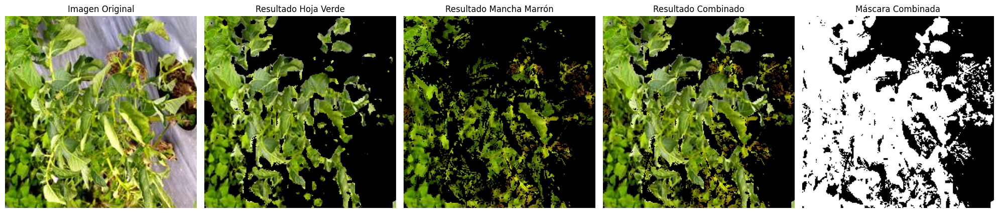

In [17]:
# Usar la función con una imagen de ejemplo
ruta_imagen = '../data/processed/preprocessed_potato_leaf/Enfermedades bacterianas/imagen_0002.jpg'
resultados = segmentar_colores(ruta_imagen, rangos_colores)

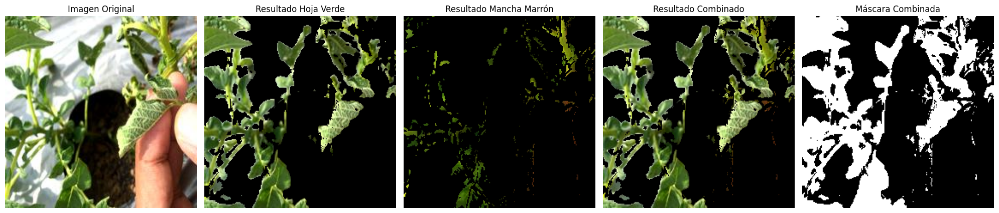

In [64]:
input_image_path ='../data/processed/preprocessed_potato_leaf/Enfermedades bacterianas/imagen_1135.jpg'
resultados = segmentar_colores(input_image_path , rangos_colores)


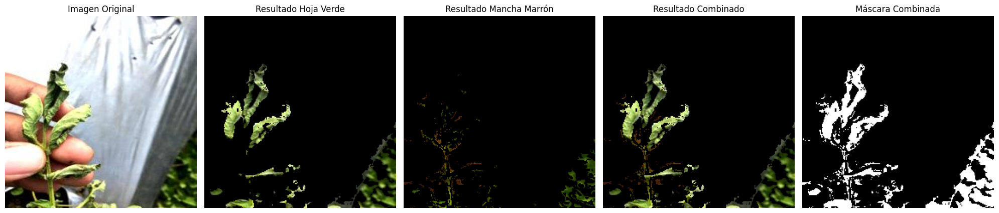

In [65]:
# Usar la función con una imagen de ejemplo
ruta_imagen = '../data/processed/preprocessed_potato_leaf/Enfermedades bacterianas/imagen_1002.jpg'
resultados = segmentar_colores(ruta_imagen, rangos_colores)

In [49]:
import os
import concurrent.futures
import cv2

def procesar_imagenes_segmentacion(input_folder, output_folder_no_bg, output_folder_mask, rangos_colores):
    # Asegurarse de que las carpetas de salida existan
    os.makedirs(output_folder_no_bg, exist_ok=True)
    os.makedirs(output_folder_mask, exist_ok=True)

    # Obtener lista de archivos de imagen en la carpeta de entrada
    image_files = [f for f in os.listdir(input_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp'))]

    def process_single_image(image_file):
        input_path = os.path.join(input_folder, image_file)
        
        # Llamar a la función segmentar_colores existente
        resultados = segmentar_colores(input_path, rangos_colores)
        
        if resultados is not None:
            nombre_base = os.path.splitext(image_file)[0]
            
            # Guardar imagen combinada
            output_path_no_bg = os.path.join(output_folder_no_bg, f"{nombre_base}_combinado.jpg")
            cv2.imwrite(output_path_no_bg, resultados["combinado"])
            
            # Guardar máscara combinada
            output_path_mask = os.path.join(output_folder_mask, f"{nombre_base}_mascara.png")
            mascara_combinada = cv2.cvtColor(resultados["combinado"], cv2.COLOR_BGR2GRAY)
            _, mascara_binaria = cv2.threshold(mascara_combinada, 1, 255, cv2.THRESH_BINARY)
            cv2.imwrite(output_path_mask, mascara_binaria)
            
            return f"Procesada: {image_file}"
        else:
            return f"Error al procesar: {image_file}"

    # Usar multithreading para procesar las imágenes en paralelo
    with concurrent.futures.ThreadPoolExecutor() as executor:
        results = list(executor.map(process_single_image, image_files))

    # Imprimir resultados
    for result in results:
        print(result)

In [46]:
input_folder = '../data/processed/preprocessed_potato_leaf/Enfermedades bacterianas'
output_folder_no_bg = '../data/final_data_sin_fonfo/Enfermedades bacterianas'
output_folder_mask = '../data/final_data_Maskara/Enfermedades bacterianas'


In [ ]:
#procesar_imagenes_segmentacion(input_folder, output_folder_no_bg, output_folder_mask, rangos_colores)

#### version_2

In [19]:

def segmentar_colores(imagen_ruta, rangos_colores):
    # Cargar la imagen usando PIL
    imagen_pil = Image.open(imagen_ruta)
    
    # Convertir la imagen PIL a un array numpy compatible con OpenCV
    imagen = cv2.cvtColor(np.array(imagen_pil), cv2.COLOR_RGB2BGR)
    
    # Convertir la imagen a espacio de color HSV
    imagen_hsv = cv2.cvtColor(imagen, cv2.COLOR_BGR2HSV)
    
    resultados = {}
    mascaras = []
    
    titulos = ["Imagen Original"]
    imagenes = [imagen]

    for nombre_mascara, rangos in rangos_colores.items():
        mascara_combinada = np.zeros(imagen.shape[:2], dtype=np.uint8)
        for bajo, alto in rangos:
            mascara = cv2.inRange(imagen_hsv, np.array(bajo), np.array(alto))
            mascara_combinada = cv2.bitwise_or(mascara_combinada, mascara)
        
        # Aplicar operaciones morfológicas más agresivas
        kernel = np.ones((5,5), np.uint8)
        mascara_clean = cv2.morphologyEx(mascara_combinada, cv2.MORPH_OPEN, kernel)
        mascara_clean = cv2.morphologyEx(mascara_clean, cv2.MORPH_CLOSE, kernel)
        
        mascaras.append(mascara_clean)
        
        resultado = cv2.bitwise_and(imagen, imagen, mask=mascara_clean)
        resultados[nombre_mascara] = resultado
        
        titulos.append(f'Resultado {nombre_mascara}')
        imagenes.append(resultado)

    mascara_total = np.zeros(imagen.shape[:2], dtype=np.uint8)
    for mascara in mascaras:
        mascara_total = cv2.bitwise_or(mascara_total, mascara)
    
    # Filtrar puntos blancos
    imagen_gris = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
    _, mascara_no_blanco = cv2.threshold(imagen_gris, 230, 255, cv2.THRESH_BINARY_INV)
    mascara_total = cv2.bitwise_and(mascara_total, mascara_no_blanco)
    
    resultado_combinado = cv2.bitwise_and(imagen, imagen, mask=mascara_total)
    resultados["combinado"] = resultado_combinado

    titulos.append("Resultado Combinado")
    imagenes.append(resultado_combinado)

    mostrar_imagen(titulos, imagenes)
    
    return resultados

In [20]:
rangos_colores = {
    "hoja_verde": [[(30, 30, 30), (90, 255, 255)]],
    "mancha_marron": [[(0, 20, 40), (30, 255, 255)],
                      [(160, 20, 20), (180, 255, 255)]]
}



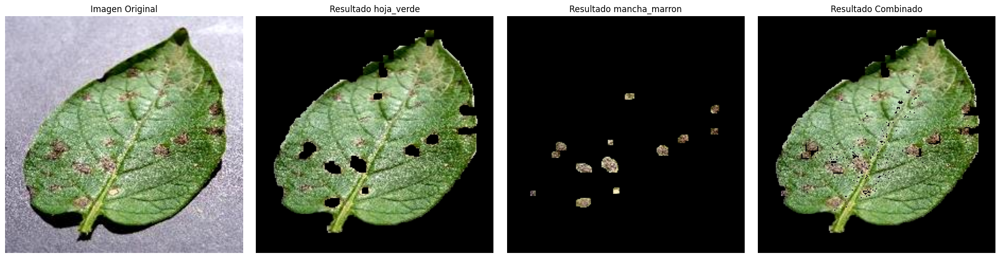

In [56]:
# Usar la función con una imagen de ejemplo
input_image_path ='../data/processed/preprocessed_potato_leaf/Tizón temprano/imagen_0005.jpg'

resultados = segmentar_colores(input_image_path, rangos_colores)

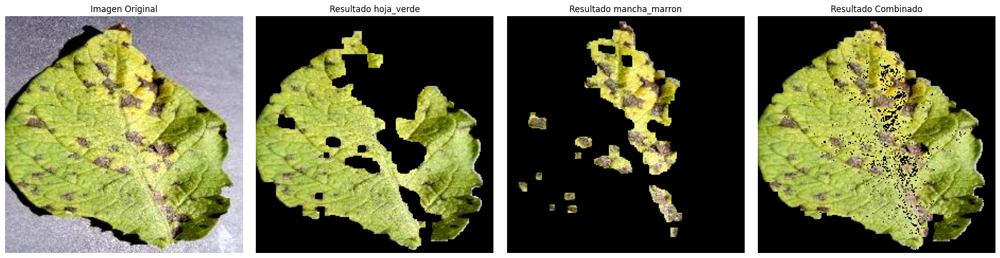

In [21]:
# Usar la función con una imagen de ejemplo
input_image_path ='../data/processed/preprocessed_potato_leaf/Tizón temprano/imagen_0010.jpg'

resultados = segmentar_colores(input_image_path, rangos_colores)

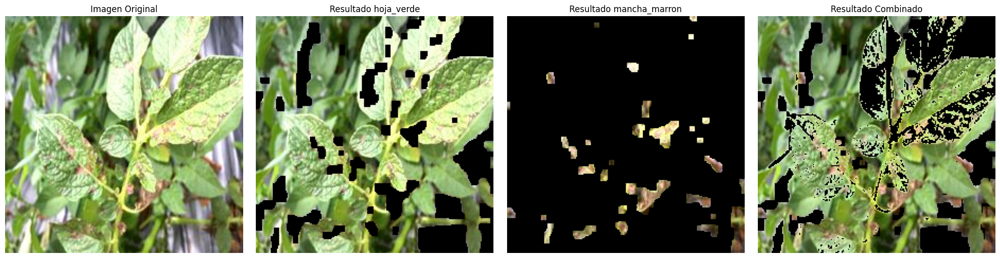

In [23]:
# Usar la función con una imagen de ejemplo
ruta_imagen = '../data/processed/preprocessed_potato_leaf/Enfermedades fúngicas/imagen_1002.jpg'
resultados = segmentar_colores(ruta_imagen, rangos_colores)

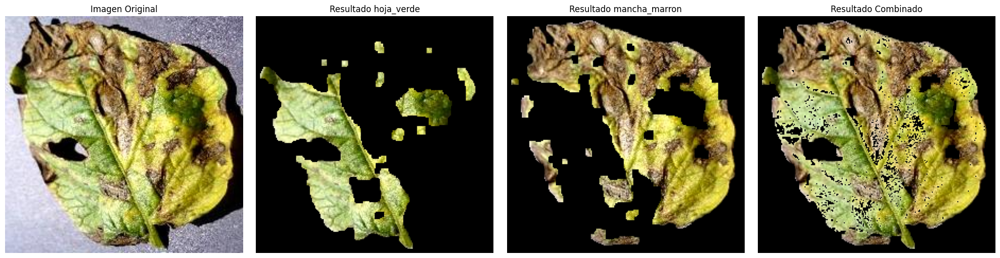

In [58]:
# Usar la función con una imagen de ejemplo
input_image_path ='../data/processed/preprocessed_potato_leaf/Tizón temprano/imagen_0110.jpg'

resultados = segmentar_colores(input_image_path, rangos_colores)

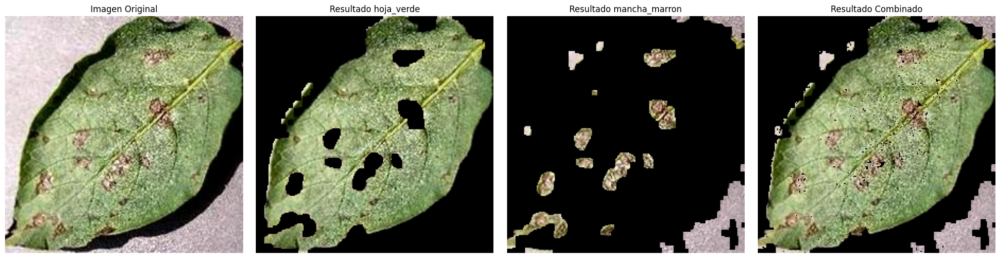

In [60]:
# Usar la función con una imagen de ejemplo
input_image_path ='../data/processed/preprocessed_potato_leaf/Tizón temprano/imagen_1010.jpg'

resultados = segmentar_colores(input_image_path, rangos_colores)